Plot cav1 tracks, for SM and DPPE lipid tracking, at cav1 sites and random sites, in various ways.

In [18]:
import os
import warnings
import copy
import tifffile
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import sys
sys.path.append("..")
from DiffusionAnalysis import DiffusionAnalysis
import obf_support

# warning suppression
from pandas.errors import SettingWithCopyWarning
warnings.filterwarnings("ignore", category=SettingWithCopyWarning)
warnings.filterwarnings('ignore')

plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['font.family'] = 'arial'

parentdir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))

In [5]:
## RANDOM SM - LOAD DATA
analysis0214 = DiffusionAnalysis('random-SM-0214')
analysis0214.load_pickleddata(os.path.join(parentdir, 'exampledata\\cav1\\random-sm\\240214'))
analysis0214.roi_data['date'] = pd.DataFrame(['0214' for i in range(len(analysis0214.roi_data))])
analysis0214.track_data['date'] = pd.DataFrame(['0214' for i in range(len(analysis0214.track_data))])

analysis0925 = DiffusionAnalysis('random-SM-0925')
analysis0925.load_pickleddata(os.path.join(parentdir, 'exampledata\\cav1\\random-sm\\240925'))
analysis0925.roi_data['date'] = pd.DataFrame(['0925' for i in range(len(analysis0925.roi_data))])
analysis0925.track_data['date'] = pd.DataFrame(['0925' for i in range(len(analysis0925.track_data))])

roi_data_comb_random_sm = pd.concat([analysis0214.roi_data, analysis0925.roi_data])
track_data_comb_random_sm = pd.concat([analysis0214.track_data, analysis0925.track_data])

In [6]:
## RANDOM DPPE - LOAD DATA
analysis0214 = DiffusionAnalysis('random-DPPE-0214')
analysis0214.load_pickleddata(os.path.join(parentdir, 'exampledata\\cav1\\random-dppe\\240214'))
analysis0214.roi_data['date'] = pd.DataFrame(['0214' for i in range(len(analysis0214.roi_data))])
analysis0214.track_data['date'] = pd.DataFrame(['0214' for i in range(len(analysis0214.track_data))])

analysis0925 = DiffusionAnalysis('random-DPPE-0925')
analysis0925.load_pickleddata(os.path.join(parentdir, 'exampledata\\cav1\\random-dppe\\240214'))
analysis0925.roi_data['date'] = pd.DataFrame(['0925' for i in range(len(analysis0925.roi_data))])
analysis0925.track_data['date'] = pd.DataFrame(['0925' for i in range(len(analysis0925.track_data))])

roi_data_comb_random_dppe = pd.concat([analysis0214.roi_data, analysis0925.roi_data])
track_data_comb_random_dppe = pd.concat([analysis0214.track_data, analysis0925.track_data])

In [15]:
## SITE DPPE - LOAD DATA
analysis0209 = DiffusionAnalysis('site-DPPE-0209')
analysis0209.load_pickleddata(os.path.join(parentdir, 'exampledata\\cav1\\site-dppe\\240209'))
analysis0209.roi_data['date'] = pd.DataFrame(['0209' for i in range(len(analysis0209.roi_data))])
analysis0209.track_data['date'] = pd.DataFrame(['0209' for i in range(len(analysis0209.track_data))])

analysis0925 = DiffusionAnalysis('site-DPPE-0925')
analysis0925.load_pickleddata(os.path.join(parentdir, 'exampledata\\cav1\\site-dppe\\240925'))
analysis0925.roi_data['date'] = pd.DataFrame(['0925' for i in range(len(analysis0925.roi_data))])
analysis0925.track_data['date'] = pd.DataFrame(['0925' for i in range(len(analysis0925.track_data))])

roi_data_comb_site_dppe = pd.concat([analysis0209.roi_data, analysis0925.roi_data])
track_data_comb_site_dppe = pd.concat([analysis0209.track_data, analysis0925.track_data])

In [16]:
## SITE SM - LOAD DATA
analysis0209 = DiffusionAnalysis('site-SM-0209')
analysis0209.load_pickleddata(os.path.join(parentdir, 'exampledata\\cav1\\site-sm\\240209'))
analysis0209.roi_data['date'] = pd.DataFrame(['0209' for i in range(len(analysis0209.roi_data))])
analysis0209.track_data['date'] = pd.DataFrame(['0209' for i in range(len(analysis0209.track_data))])

analysis0925 = DiffusionAnalysis('site-SM-0925')
analysis0925.load_pickleddata(os.path.join(parentdir, 'exampledata\\cav1\\site-sm\\240925'))
analysis0925.roi_data['date'] = pd.DataFrame(['0925' for i in range(len(analysis0925.roi_data))])
analysis0925.track_data['date'] = pd.DataFrame(['0925' for i in range(len(analysis0925.track_data))])

roi_data_comb_site_sm = pd.concat([analysis0209.roi_data, analysis0925.roi_data])
track_data_comb_site_sm = pd.concat([analysis0209.track_data, analysis0925.track_data])

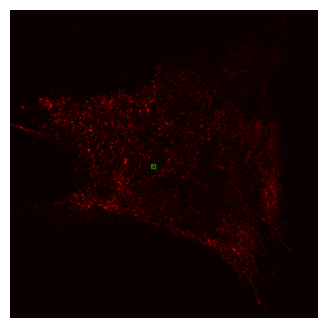

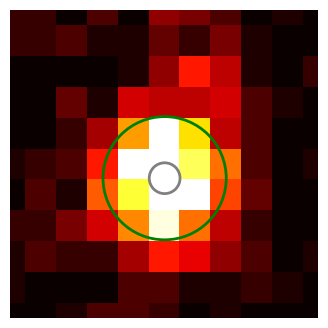

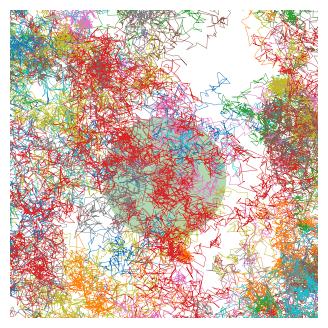

In [11]:
### PLOT SINGLE ROI - CONFOCAL WITH SITE CIRCLES AND TRACKS ON CIRCLES
### PLOTTING PARAMS
%matplotlib inline

cell_idx = 0
roi_idx = 0
trackratio = 1
analysis = analysis0209

tridxs = []
# load data
roi = analysis.roi_data[(analysis.roi_data['conf_idx'] == cell_idx) & (analysis.roi_data['roi_idx'] == roi_idx)].iloc[0]
roi_pos_um = roi['roi_pos']
pxsize = roi['pxsize']
pxshift = pxsize/2
image_conf = roi['conf_img']
conf_xlim = roi['conf_xlims']
conf_ylim = roi['conf_ylims']
conf_offset = roi['conf_offset']
x_conf_correction = roi['conf_xcorr']
y_conf_correction = roi['conf_ycorr']
track_data_roi_idxs = analysis.track_data.index[(analysis.track_data['confidx'] == cell_idx) & (analysis.track_data['roiidx'] == roi_idx)].tolist()
track_roi_data = analysis.track_data.loc[track_data_roi_idxs]

# plot large confocal image
fig1 = plt.figure(figsize=(4,4))
axlargeconf = plt.gca()
imgplot_large = plt.imshow(image_conf, cmap='hot', vmax=60)
extents_largeconfimg = np.array(imgplot_large.get_extent())*pxsize+[pxshift, pxshift, pxshift, pxshift]+[conf_offset[0], conf_offset[0], conf_offset[1], conf_offset[1]]+[x_conf_correction, x_conf_correction, y_conf_correction, y_conf_correction]
imgplot_large.set_extent(extents_largeconfimg)  # scale overlay image to the correct pixel size for the tracks
axlargeconf.set_axis_off()

# get image zoom from track coordinates
fig2 = plt.figure(figsize=(4,4))
axroizoom_onlyconf = plt.gca()
fig3 = plt.figure(figsize=(4,4))
axroizoom_onlytracks = plt.gca()
img_onlyconf = axroizoom_onlyconf.imshow(image_conf, cmap='hot', vmax=30)
extents_confimg = np.array(img_onlyconf.get_extent())*pxsize+[pxshift, pxshift, pxshift, pxshift]+[conf_offset[0], conf_offset[0], conf_offset[1], conf_offset[1]]+[x_conf_correction, x_conf_correction, y_conf_correction, y_conf_correction]
img_onlyconf.set_extent(extents_confimg)  # scale overlay image to the correct pixel size for the tracks

# add circles for caveolae site to zooms
cav_circ_onlyconf = patches.Circle((roi_pos_um[0]+x_conf_correction+pxshift, roi_pos_um[1]+y_conf_correction+pxshift), analysis.ana_site_rad, edgecolor='g', linewidth=2, facecolor='none')
cav_circ_onlytracks = patches.Circle((roi_pos_um[0]+x_conf_correction+pxshift, roi_pos_um[1]+y_conf_correction+pxshift), analysis.ana_site_rad, edgecolor='none', facecolor='g', alpha=0.3)
cav_circ_incl_onlyconf = patches.Circle((roi_pos_um[0]+x_conf_correction+pxshift, roi_pos_um[1]+y_conf_correction+pxshift), analysis.inclusion_rad, edgecolor='gray', linewidth=2, facecolor='none')
cav_circ_incl_onlytracks  = patches.Circle((roi_pos_um[0]+x_conf_correction+pxshift, roi_pos_um[1]+y_conf_correction+pxshift), analysis.inclusion_rad, edgecolor='none', facecolor='gray', alpha=0.3)
axroizoom_onlyconf.add_patch(cav_circ_onlyconf);
axroizoom_onlytracks.add_patch(cav_circ_onlytracks);
axroizoom_onlyconf.add_patch(cav_circ_incl_onlyconf);
axroizoom_onlytracks.add_patch(cav_circ_incl_onlytracks);

# add square for ROI position in large confocal image
roi_square = patches.Rectangle((conf_xlim[0], conf_ylim[0]), conf_xlim[1]-conf_xlim[0], conf_ylim[1]-conf_ylim[0], edgecolor='g', linewidth=1, facecolor='none')
axlargeconf.add_patch(roi_square);

# set axis limits for all zooms
axroizoom_onlytracks.set_xlim(*conf_xlim)
axroizoom_onlytracks.set_ylim(*conf_ylim)
axroizoom_onlyconf.set_xlim(*conf_xlim)
axroizoom_onlyconf.set_ylim(*conf_ylim)
for idx,track in track_roi_data.iterrows():
    if idx%int(1/trackratio)==0:  # only plot every 1/trackratioth track
        #if idx<100:
        if track['filter'] == 0:
            axroizoom_onlytracks.plot(track['x'], track['y'], linewidth=0.3);
            tridxs.append(track['tridx'])
axroizoom_onlytracks.set_aspect('equal', adjustable='box')
axroizoom_onlyconf.set_aspect('equal', adjustable='box')
axroizoom_onlyconf.set_axis_off()
axroizoom_onlytracks.set_axis_off()

plt.show()


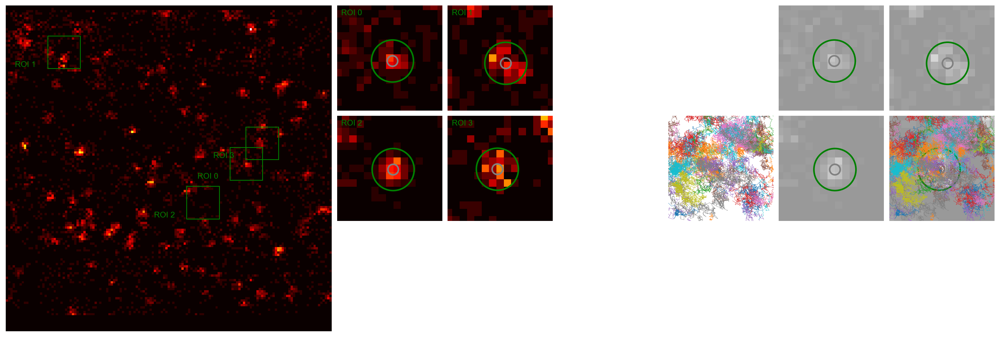

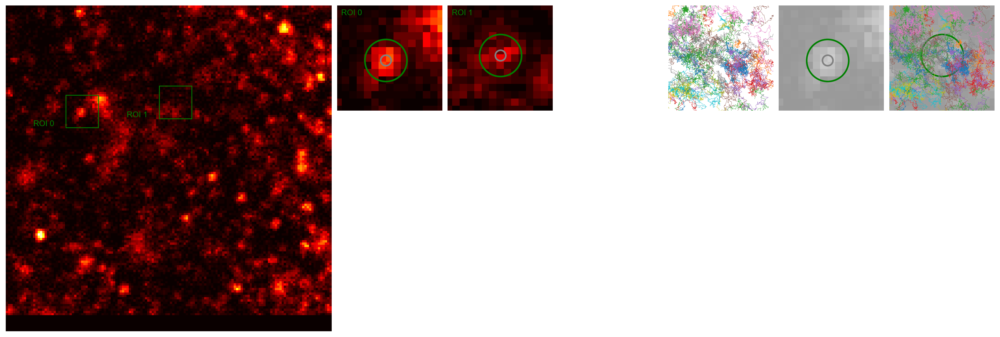

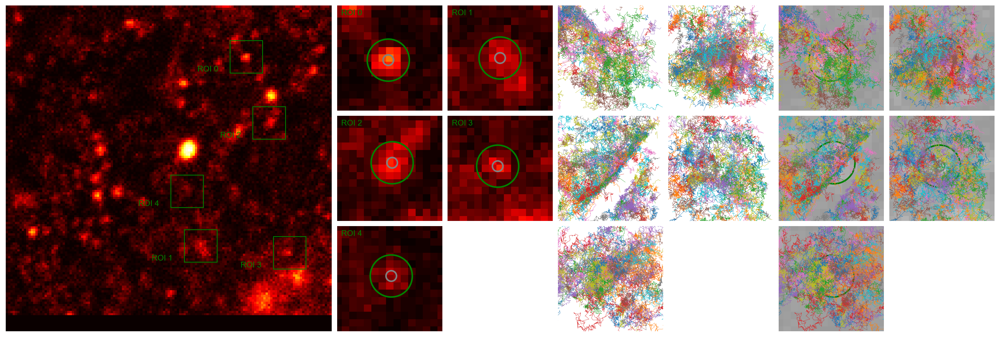

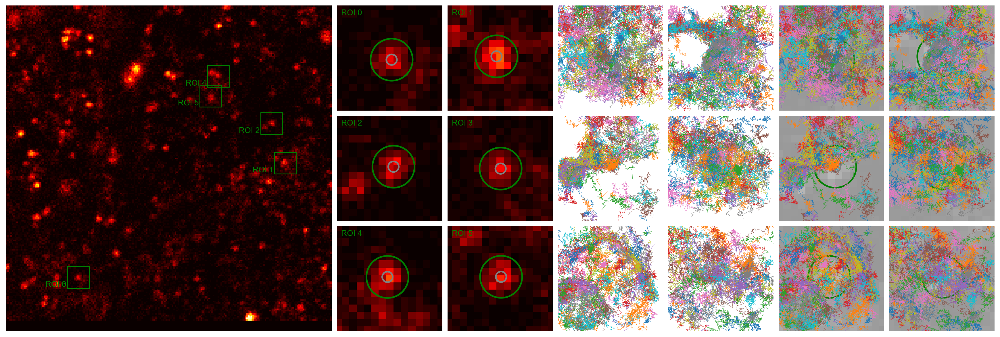

In [14]:
##### PLOT TRACKS IN ALL ROIS FROM PRELOADED ANALYSIS OBJECT
%matplotlib inline

for cell_idx in range(5):
    try:
        analysis0925.plot_fullroi_sixsites(cell_idx=cell_idx, singleroi=True, trackratio=1.0)
    except:
        pass

Confocal file 1/2
c:\Users\alvelidjonatan\Documents\GitHub\etMINFLUX-analysis-public\exampledata\cav1\site-sm\240209\240209-123152_conf-raw.tif
c:\Users\alvelidjonatan\Documents\GitHub\etMINFLUX-analysis-public\exampledata\cav1\site-sm\240209\240209-123152_minflux.msr
Confocal file 2/2
c:\Users\alvelidjonatan\Documents\GitHub\etMINFLUX-analysis-public\exampledata\cav1\site-sm\240209\240209-155203_conf-raw.tif
c:\Users\alvelidjonatan\Documents\GitHub\etMINFLUX-analysis-public\exampledata\cav1\site-sm\240209\240209-155203_minflux.msr


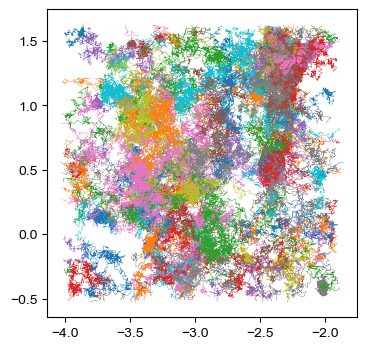

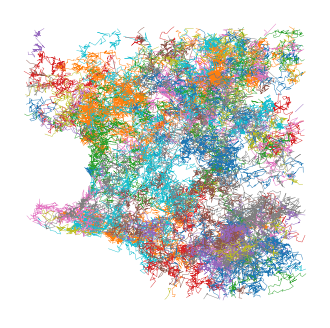

Confocal file 1/2
c:\Users\alvelidjonatan\Documents\GitHub\etMINFLUX-analysis-public\exampledata\cav1\site-sm\240209\240209-123152_conf-raw.tif
c:\Users\alvelidjonatan\Documents\GitHub\etMINFLUX-analysis-public\exampledata\cav1\site-sm\240209\240209-123152_minflux.msr
Confocal file 2/2
c:\Users\alvelidjonatan\Documents\GitHub\etMINFLUX-analysis-public\exampledata\cav1\site-sm\240209\240209-155203_conf-raw.tif
c:\Users\alvelidjonatan\Documents\GitHub\etMINFLUX-analysis-public\exampledata\cav1\site-sm\240209\240209-155203_minflux.msr


IndexError: list index out of range

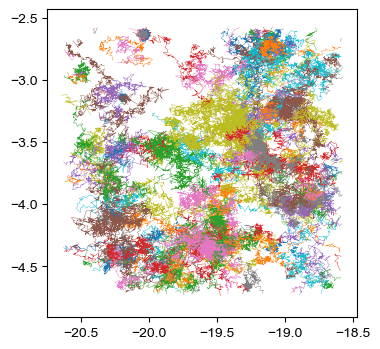

In [35]:
### PLOT TRACKS ON THEIR OWN
path = os.path.join(parentdir, 'exampledata\\cav1\\site-sm\\240209')

filelist = os.listdir(path)
filelist_rois_all = [file for file in filelist if file.endswith('.npy')]
filelist_conf = [file for file in filelist if 'conf' in file and 'analysis' not in file and '.png' not in file and 'roi' not in file and 'fullfov' not in file]
filelist_msr = [file for file in filelist if file.endswith('.msr')]
N_rois = len(filelist_rois_all)

confidxs = []
roiidxs = []
roinames = []
roipospxs = []
roiposs = []
roisizes = []
roiimgconfs = []
roipxsizes = []
roiconfoffset = []
roiconfsize = []
roiconfsizepx = []
roiconfxlims = []
roiconfylims = []
roixconfcorr = []
roiyconfcorr = []

for roi_idx in range(N_rois):
    for file_idx in range(len(filelist_conf)):
        print(f'Confocal file {file_idx+1}/{len(filelist_conf)}')
        curr_img_data = {'confidx': [], 'roiidx': [], 'tridx': [], 'roisize': [], 'roipos': [], 'roipos_px': [], 'tim0': [], 'x': [], 'y': [], 'tim': [], 'pxsize': [], 'inout_flag': [], 'inout_len': [], 'inout_mask': [], 'inout_incl_flag': [], 'inout_incl_len': [], 'inout_incl_mask': [], 'filter': [], 'confimg':[], 'confimg_ext': [], 'conf_xlim': [], 'conf_ylim': [], 'conf_xcorr': [], 'conf_ycorr': []}
        file_conf = os.path.join(path, filelist_conf[file_idx])
        file_msr = os.path.join(path, filelist_msr[file_idx])
        print(file_conf)
        print(file_msr)
        conf_time = int(filelist_conf[file_idx].split('-')[1].split('_')[0])
        if file_idx > 0:
            conf_date_prev = copy.deepcopy(conf_date)
        else:
            conf_date_prev = 0
        conf_date = int(filelist_conf[file_idx].split('-')[0])
        if file_idx > 0 and conf_date == conf_date_prev:
            conf_time_prev = int(filelist_conf[file_idx-1].split('-')[1].split('_')[0])
        else:
            conf_time_prev = 0
        filelist_rois = [file for file in filelist_rois_all if int(file.split('-')[0])==conf_date and int(file.split('-')[1].split('_')[0])>conf_time_prev and int(file.split('-')[1].split('_')[0])<conf_time]
        image_conf = tifffile.imread(file_conf)[-1]
        
        # get metadata from confocal image in msr file (pixel size, image shape, image size, origin offset)
        msr_dataset = obf_support.File(file_msr)
        conf_msr_stack_index = 0
        conf_stack = msr_dataset.stacks[conf_msr_stack_index]
        pxsize = conf_stack.pixel_sizes[0]*1e6
        pxshift = pxsize/2
        conf_size_px = (conf_stack.shape[0], conf_stack.shape[1])
        conf_size = (conf_stack.lengths[0]*1e6, conf_stack.lengths[1]*1e6)
        conf_offset = (conf_stack.offsets[0]*1e6, conf_stack.offsets[1]*1e6)

        file = filelist_rois[roi_idx]
        roi_name = int(file.split('ROI')[1].split('-')[0])
        roi_pos = (int(file.split('[')[1].split(',')[0]),int(file.split(']')[0].split(',')[1]))
        roi_pos_um = (roi_pos[0]*pxsize+conf_offset[0], roi_pos[1]*pxsize+conf_offset[1])
        roi_size_um = (float(file.split('[')[2].split(',')[0]),float(file.split(']')[1].split(',')[1]))
        dataset = np.load(os.path.join(path, file))
        x = np.zeros((len(dataset),1))
        y = np.zeros((len(dataset),1))
        tid = np.zeros((len(dataset),1))
        tim = np.zeros((len(dataset),1))
        for i in range(len(dataset)):
            x[i] = dataset[i][0][3][2][0]
            y[i] = dataset[i][0][3][2][1]
            tid[i] = dataset[i][4]
            tim[i] = dataset[i][3]
        x_raw = x * 1e6
        y_raw = y * 1e6
        tid = tid.flatten()
        tim = tim.flatten()
        track_ids = list(map(int, set(tid)))
        track_ids.sort()

        # calculate x and y lims of ROI zoom
        xlim = [roi_pos_um[0]+pxshift-0.5, roi_pos_um[0]+pxshift+0.5]
        ylim = [roi_pos_um[1]+pxshift+0.5, roi_pos_um[1]+pxshift-0.5]

        # get image zoom from track coordinates
        plt.figure(figsize=(4,4))
        for track in track_ids[::]:
            x_track = np.array([val for val,tr in zip(x_raw,tid) if tr==track]).flatten()
            y_track = np.array([val for val,tr in zip(y_raw,tid) if tr==track]).flatten()
            tim_track = np.array([val for val,tr in zip(tim,tid) if tr==track]).flatten()
            plt.plot(x_track, y_track, linewidth=0.3);
    plt.axis('off')
    plt.show()

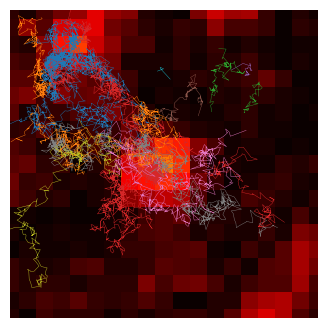

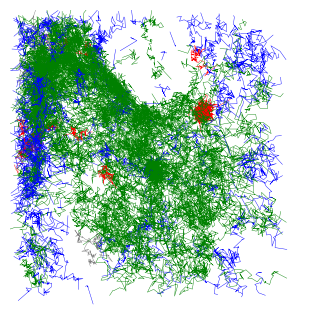

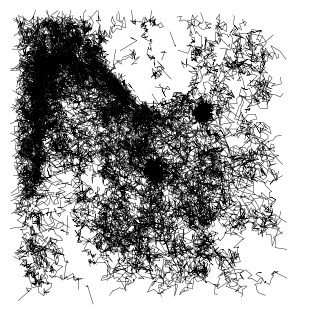

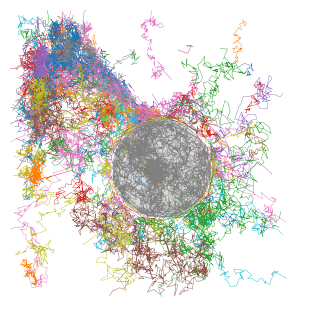

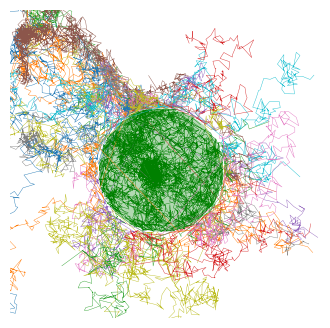

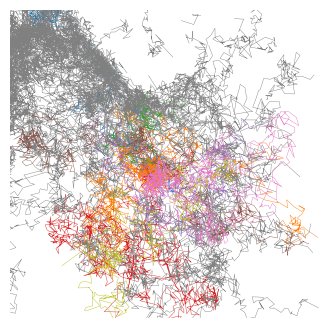

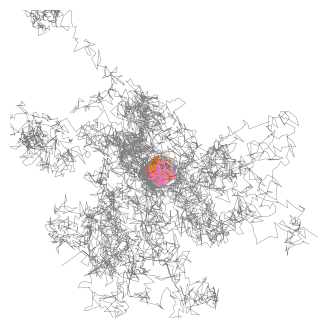

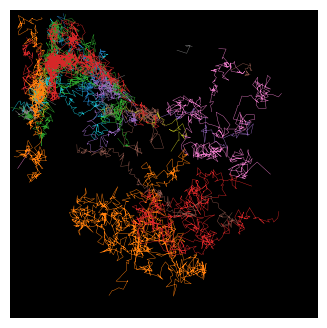

In [32]:
idx=1
analysis0925.plot_overlaytracks(roi_number=idx, trackratio=0.1)
analysis0925.plot_filteredtracks(roi_number=idx, trackratio=1)
analysis0925.plot_alltracks(roi_number=idx, trackratio=1)
analysis0925.plot_outside_tracks(roi_number=idx, trackratio=1)
analysis0925.plot_inouttracks(roi_number=idx, plot_lim_add=0, trackratio=1)
analysis0925.plot_inclusiontracks(roi_number=idx, plot_lim_add=0, trackratio=1)
analysis0925.plot_residencetime_tracks(roi_number=idx, plot_lim_add=0, trackratio=1)
analysis0925.plot_tracks(roi_number=idx, trackratio=0.3)